<a href="https://colab.research.google.com/github/smirzap/AI-dengan-DL/blob/main/food101_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TRANSFER LEARNING

*Lihat Buku BAB 11*

**Transfer Learning** adalah metode Machine Learning yang memungkinkan model-model yang telah dikembangkan untuk suatu tugas tertentu digunakan kembali sebagai titik awal untuk (membuat) model pada tugas-tugas lain yang serupa.


Tiga strategy Transfer Learning:
1. **Strategi 1** yang melatih ulang semua lapisan atau parameter pada jaringan
2. **Strategi 2** yang melatih sebagian lapisan pada jaringan, yaitu lapisan-lapisan pada bagian belakang dan lapisan FC/DNN.
3. **Strategi 3** yang melatih hanya bagian classifier atau lapisan FC/DNN saja.

Terdapat tiga eksperimen sesuai dengan jenis strategi penggunaan Transfer Learning. Sumber data berasal dari Food101:
* Dipilih 10 kategori makanan (dari 101 kategori) dengan masing-masing kategori berisikan 75 gambar pada training set dan 250 gambar pada test set.
* Sepuluh kategori makanan pada training set adalah chicken_curry, chicken_wings, fried_rice, grilled_salmon, hamburger, ice_cream, pizza, ramen, steak, dan sushi.




## A. Pastikan Pengunaan GPU

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Pastikan Anda menggunakan GPU dengan perintah berikut
!nvidia-smi

Sat Jul  1 09:14:59 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8    12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## B. Unduh Dataset Food101 dengan 10 Label

In [ ]:
from zipfile import ZipFile

# Ambil dataset Food101 yang telah ditetapkan 10 kategori makanan
# Kemudian unzip data tersebut

food_file = '/content/drive/MyDrive/10_food_classes_10_percent.zip'
with ZipFile(food_file) as zip:
  zip.extractall()

In [ ]:
# Lihat nama-nama direktori yang berisikan dataset
!ls 10_food_classes_10_percent

test  train


In [ ]:
dir_path = '10_food_classes_10_percent/'
training_set_dir = dir_path + 'train/'
test_set_dir = dir_path + 'test/'



---


**Catatan Kode di bawah:**

`os.walk()` adalah fungsi untuk mengitari secara rekursif sebuah pohon direktori dan mengembalikan tuple yang terdiri dari 3 komponen, yaitu `dirpath`, `dirnames`, `filenames`, untuk setiap direktori di pohon.
*   `dirpath` adalah jalur ke direktori
*   `dirnames` adalah daftar nama subdirektori di direktori
* `filenames` adalah daftar nama file di direktori

In [ ]:
import os

# Mari kita lihat jumlah example pada training set dan test set
for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"Terdapat {len(dirnames)} direktori and {len(filenames)} file gambar di '{dirpath}'.")

Terdapat 2 direktori and 0 file gambar di '10_food_classes_10_percent/'.
Terdapat 10 direktori and 0 file gambar di '10_food_classes_10_percent/train'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/steak'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/ice_cream'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/ramen'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/hamburger'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/grilled_salmon'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/sushi'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/fried_rice'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/chicken_curry'.
Terdapat 0 direktori and 75 file gambar di '10_food_classes_10_percent/train/chicken_wings'.
Terdapat 0 direktori and 75 file gambar di '1

## C. Buat Training dan Test Set

**Catatan kode di bawah:**

`image_dataset_from_directory()` adalah fungsi TensorFlow yang digunakan untuk membuat dataset gambar dari direktori.

In [ ]:
# import fungsi untuk penyiapan dataset dalam format TensorFlow
from tensorflow.keras.preprocessing import image_dataset_from_directory

# ukuran gambar input yang akan diproses (tinggi, lebar)
# jika ukuran berbeda maka akan dibuat menjadi ukuran ini
IMAGE_SIZE = (224, 224)

# ukuran batch (jumlah gambar perbatch) yang akan dibuat
# jika gunakan nilai default = 32
# maka batch yang terdiri dari 32 gambar akan dikirimkan ke model pada setiap putaran
BATCH_SIZE = 32

# Penyiapan training set
# Lihat buku untuk penjelasan setiap parameter
training_set = image_dataset_from_directory(directory=training_set_dir,
                                            image_size=IMAGE_SIZE,
                                            label_mode='categorical',
                                            batch_size=BATCH_SIZE,
                                            validation_split=0.3,
                                            subset='training',
                                            seed=42)

# Penyiapan validation set (30% dari training set)
validation_set = image_dataset_from_directory(directory=training_set_dir,
                                            image_size=IMAGE_SIZE,
                                            label_mode='categorical',
                                            batch_size=BATCH_SIZE,
                                            validation_split=0.3,
                                            subset='validation',
                                            seed=42)

# Penyiapan test set
test_set = image_dataset_from_directory(directory=test_set_dir,
                                        image_size=IMAGE_SIZE,
                                        label_mode='categorical')

Found 750 files belonging to 10 classes.
Using 525 files for training.
Found 750 files belonging to 10 classes.
Using 225 files for validation.
Found 2500 files belonging to 10 classes.


In [ ]:
# lihat 10 nama kategori makanan pada dataset
training_set.class_names

['chicken_curry',
 'chicken_wings',
 'fried_rice',
 'grilled_salmon',
 'hamburger',
 'ice_cream',
 'pizza',
 'ramen',
 'steak',
 'sushi']



---


**Catatan untuk output di bawah ini:**
* `(None, 224, 224, 3)` mengacu pada bentuk tensor dari gambar kita, di mana `None` adalah ukuran batch, `224` adalah tinggi dan lebar gambar serta `3` adalah jumlah saluran warna (merah, hijau, biru)
* Baik tensor gambar dan label memiliki tipe data `tf.float32`
* Nilai `batch_size `adalah `None` karena hanya digunakan selama pelatihan model. Anda dapat menganggap `None` sebagai placeholder yang menunggu untuk diisi dengan parameter `batch_size` dari fungsi `image_dataset_from_directory()` saat model dilatih
* Penggunaan nilai placeholder `None` untuk `batch_size` memiliki beberapa keuntungan:

  1. Memungkinkan untuk menentukan nilai `batch_size` secara dinamis saat model dilatih
  2. Memungkinkan untuk menggunakan nilai `batch_size` yang berbeda untuk berbagai tahap pelatihan model




In [ ]:
# (None, 224, 224, 3) refers to the tensor shape of our images where None is the batch size, 224 is the height (and width) and 3 is the color channels (red, green, blue).
# (None, 10) refers to the tensor shape of the labels where None is the batch size and 10 is the number of possible labels (the 10 different food classes).
# Both image tensors and labels are of the datatype tf.float32.
# The batch_size is None due to it only being used during model training. You can think of None as a placeholder waiting to be filled with the batch_size parameter from image_dataset_from_directory().

training_set

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 10), dtype=tf.float32, name=None))>

## Strategi 3: Hanya Mengubah Output Layer

In [ ]:
import tensorflow as tf

tf.random.set_seed(32)

# Mari kita buat model dengan metode Transfer Learning

# Pertama pilih dan unduh pretrained model
pretrained_model = tf.keras.applications.EfficientNetV2B0(weights='imagenet',
                                                        include_top=False,
                                                        pooling='avg')

# Kunci perbaikan paramater model (frozen)
pretrained_model.trainable=False

24274472/24274472 [==============================] - 2s 0us/step


In [ ]:
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras import Model

# Buat Input karena kita menggunakan training set sendiri yang berbeda dengan ImageNet
inputs = Input(shape=(224,224,3), name='input_layer')

# Berikan input layer sebagai input pada pretrained-model
revised_model_3 = pretrained_model(inputs)

# Definisikan output layer (strategi 3)
outputs = Dense(10, activation='softmax', name='output_layer')(revised_model_3)

# defisinikan model dengan strategi 3 dengan me-link inputs dan outputs
model_3 = Model(inputs, outputs, name='model_3')

In [ ]:
# Mari kita compile model_3 agar siap dilakukan pelatihan untuk parameter jaringan
model_3.compile(loss='categorical_crossentropy',
                optimizer='adam',
                metrics='accuracy')

In [ ]:
model_3.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Function  (None, 1280)             5919312   
 al)                                                             
                                                                 
 output_layer (Dense)        (None, 10)                12810     
                                                                 
Total params: 5,932,122
Trainable params: 12,810
Non-trainable params: 5,919,312
_________________________________________________________________


In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime

!rm -rf /logs/fit/

%load_ext tensorboard

log_folder = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tb_callbacks = TensorBoard(log_dir=log_folder)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

es_callback = EarlyStopping(monitor='val_loss', patience=5, verbose=1)
mpt_callback= ModelCheckpoint(filepath='best_model_3.hdf5', save_best_only=True, verbose=1)


In [ ]:
# Sekarang kita latih model_3 untuk mendapatkan parameter pada output layer
# Wow, kita mendapat akurasi 83%! dengan menggunakan strategi 3
tf.random.set_seed(42)

import time
start = time.perf_counter()

model_3.fit(training_set,
            epochs=100,
            validation_data=validation_set,
            callbacks = [tb_callbacks, es_callback, mpt_callback])

elapsed = time.perf_counter() - start

Epoch 1/100
17/17 [==============================] - ETA: 0s - loss: 2.0386 - accuracy: 0.3295
Epoch 1: val_loss improved from inf to 1.63521, saving model to best_model_3.hdf5
17/17 [==============================] - 21s 303ms/step - loss: 2.0386 - accuracy: 0.3295 - val_loss: 1.6352 - val_accuracy: 0.5733
Epoch 2/100
16/17 [===========================>..] - ETA: 0s - loss: 1.3703 - accuracy: 0.6875
Epoch 2: val_loss improved from 1.63521 to 1.21493, saving model to best_model_3.hdf5
17/17 [==============================] - 4s 187ms/step - loss: 1.3633 - accuracy: 0.6895 - val_loss: 1.2149 - val_accuracy: 0.7556
Epoch 3/100
16/17 [===========================>..] - ETA: 0s - loss: 1.0027 - accuracy: 0.7871
Epoch 3: val_loss improved from 1.21493 to 1.00411, saving model to best_model_3.hdf5
17/17 [==============================] - 3s 127ms/step - loss: 1.0062 - accuracy: 0.7829 - val_loss: 1.0041 - val_accuracy: 0.7422
Epoch 4/100
16/17 [===========================>..] - ETA: 0s - loss

In [ ]:
!pip install quiver_engine

In [ ]:
from gevent.pywsgi import WSGIServer

In [ ]:
WSGIServer.start(model_3)

In [ ]:
print('Elapsed %.3f seconds.' % elapsed)

Elapsed 153.449 seconds.


In [ ]:
%tensorboard --logdir={log_folder}

<IPython.core.display.Javascript object>

In [ ]:
from tensorflow.keras.models import load_model

# Load best hyperparameters from previous fit process
best_model_3 = load_model('best_model_3.hdf5')

# Let's evaluate the model
best_model_3.evaluate(test_set)

79/79 [==============================] - 8s 72ms/step - loss: 0.4076 - accuracy: 0.8732


[0.4076346158981323, 0.873199999332428]

## Strategi 2: Trainable 10 Layer

In [ ]:
# Set pretrained_model agar parameter jaringan bisa dilatih
pretrained_model.trainable=True

In [ ]:
print(len(pretrained_model.trainable_variables))

241


In [ ]:
# Perhatikan bahwa semua layer pada pretrained model telah di frozen!
for urutan, lapisan in enumerate(pretrained_model.layers):
  print(urutan, lapisan.name, lapisan.trainable)

0 input_1 True
1 rescaling True
2 normalization True
3 stem_conv True
4 stem_bn True
5 stem_activation True
6 block1a_project_conv True
7 block1a_project_bn True
8 block1a_project_activation True
9 block2a_expand_conv True
10 block2a_expand_bn True
11 block2a_expand_activation True
12 block2a_project_conv True
13 block2a_project_bn True
14 block2b_expand_conv True
15 block2b_expand_bn True
16 block2b_expand_activation True
17 block2b_project_conv True
18 block2b_project_bn True
19 block2b_drop True
20 block2b_add True
21 block3a_expand_conv True
22 block3a_expand_bn True
23 block3a_expand_activation True
24 block3a_project_conv True
25 block3a_project_bn True
26 block3b_expand_conv True
27 block3b_expand_bn True
28 block3b_expand_activation True
29 block3b_project_conv True
30 block3b_project_bn True
31 block3b_drop True
32 block3b_add True
33 block4a_expand_conv True
34 block4a_expand_bn True
35 block4a_expand_activation True
36 block4a_dwconv2 True
37 block4a_bn True
38 block4a_activ

In [ ]:
# sekarang kita unfrozen 10 layer pada bagian belakang lapisan convolution
for urutan, lapisan in enumerate(pretrained_model.layers[:-5]):
  lapisan.trainable=False

In [ ]:
print(len(pretrained_model.trainable_variables))

3


In [ ]:
# Berikan input layer sebagai input pada pretrained-model
revised_model_2 = pretrained_model(inputs)

# Definisikan output layer (strategi 2)
outputs = Dense(10, activation='softmax', name='output_layer')(revised_model_2)

# defisinikan model dengan strategi 3 dengan me-link inputs dan outputs
model_2 = Model(inputs, outputs, name='model_2')

In [ ]:
# Mari kita compile model_2 agar siap dilakukan pelatihan untuk parameter jaringan
model_2.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(), #learning_rate=0.0001
                metrics='accuracy')

In [ ]:
model_2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Function  (None, 1280)             5919312   
 al)                                                             
                                                                 
 output_layer (Dense)        (None, 10)                12810     
                                                                 
Total params: 5,932,122
Trainable params: 261,130
Non-trainable params: 5,670,992
_________________________________________________________________


In [ ]:
log_folder = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tb_callbacks = TensorBoard(log_dir=log_folder)

In [ ]:
mpt_callback= ModelCheckpoint(filepath='best_model_2.hdf5', save_best_only=True, verbose=1)

In [ ]:
# Sekarang kita latih model_3 untuk mendapatkan parameter pada output layer
# Wow, kita mendapat akurasi 83%! dengan menggunakan strategi 3

tf.random.set_seed(42)

start = time.perf_counter()

model_2.fit(training_set,
            epochs=100,
            validation_data=validation_set,
            callbacks = [tb_callbacks, es_callback, mpt_callback])

elapsed = time.perf_counter() - start

Epoch 1/100
16/17 [===========================>..] - ETA: 0s - loss: 1.6075 - accuracy: 0.5488
Epoch 1: val_loss improved from inf to 0.86844, saving model to best_model_2.hdf5
17/17 [==============================] - 14s 247ms/step - loss: 1.5952 - accuracy: 0.5562 - val_loss: 0.8684 - val_accuracy: 0.7822
Epoch 2/100
16/17 [===========================>..] - ETA: 0s - loss: 0.6713 - accuracy: 0.8359
Epoch 2: val_loss improved from 0.86844 to 0.63130, saving model to best_model_2.hdf5
17/17 [==============================] - 3s 133ms/step - loss: 0.6694 - accuracy: 0.8381 - val_loss: 0.6313 - val_accuracy: 0.8222
Epoch 3/100
16/17 [===========================>..] - ETA: 0s - loss: 0.4365 - accuracy: 0.9043
Epoch 3: val_loss improved from 0.63130 to 0.55817, saving model to best_model_2.hdf5
17/17 [==============================] - 3s 174ms/step - loss: 0.4407 - accuracy: 0.9029 - val_loss: 0.5582 - val_accuracy: 0.8311
Epoch 4/100
16/17 [===========================>..] - ETA: 0s - loss

In [ ]:
print('Elapsed %.3f seconds.' % elapsed)

Elapsed 60.139 seconds.


In [ ]:
%tensorboard --logdir={log_folder}

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-07-01 13:06:46.169098: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
Address already in use
Port 6006 is in use by another program. Either identify and stop that program, or start the s

In [ ]:
# Load best hyperparameters from previous fit process
best_model_2 = load_model('best_model_2.hdf5')

# Let's evaluate the model
best_model_2.evaluate(test_set)

79/79 [==============================] - 7s 67ms/step - loss: 0.3524 - accuracy: 0.8888


[0.35237234830856323, 0.8888000249862671]

In [ ]:
class_names = test_set.class_names
class_names

['chicken_curry',
 'chicken_wings',
 'fried_rice',
 'grilled_salmon',
 'hamburger',
 'ice_cream',
 'pizza',
 'ramen',
 'steak',
 'sushi']

## Strategi 1: Seluruh Paramater Dilatih

In [ ]:
# Set pretrained_model agar parameter jaringan bisa dilatih
pretrained_model.trainable=True

In [ ]:
# Perhatikan bahwa semua layer pada pretrained model telah di frozen!
for urutan, lapisan in enumerate(pretrained_model.layers):
  print(urutan, lapisan.name, lapisan.trainable)

0 input_1 True
1 rescaling True
2 normalization True
3 stem_conv True
4 stem_bn True
5 stem_activation True
6 block1a_project_conv True
7 block1a_project_bn True
8 block1a_project_activation True
9 block2a_expand_conv True
10 block2a_expand_bn True
11 block2a_expand_activation True
12 block2a_project_conv True
13 block2a_project_bn True
14 block2b_expand_conv True
15 block2b_expand_bn True
16 block2b_expand_activation True
17 block2b_project_conv True
18 block2b_project_bn True
19 block2b_add True
20 block3a_expand_conv True
21 block3a_expand_bn True
22 block3a_expand_activation True
23 block3a_project_conv True
24 block3a_project_bn True
25 block3b_expand_conv True
26 block3b_expand_bn True
27 block3b_expand_activation True
28 block3b_project_conv True
29 block3b_project_bn True
30 block3b_add True
31 block4a_expand_conv True
32 block4a_expand_bn True
33 block4a_expand_activation True
34 block4a_dwconv2 True
35 block4a_bn True
36 block4a_activation True
37 block4a_se_squeeze True
38 b

In [ ]:
# Berikan input layer sebagai input pada pretrained-model
revised_model_1 = pretrained_model(inputs)

# Definisikan output layer (strategi 1)
outputs = Dense(10, activation='softmax', name='output_layer')(revised_model_1)

# defisinikan model dengan strategi 3 dengan me-link inputs dan outputs
model_1 = Model(inputs, outputs, name='model_1')

In [ ]:
# Mari kita compile model_1 agar siap dilakukan pelatihan untuk parameter jaringan
model_1.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(), #learning_rate=0.0001
                metrics='accuracy')

In [ ]:
log_folder = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tb_callbacks = TensorBoard(log_dir=log_folder)

In [ ]:
mpt_callback= ModelCheckpoint(filepath='best_model_1.hdf5', save_best_only=True, verbose=1)

In [ ]:
# Sekarang kita latih model_3 untuk mendapatkan parameter pada output layer
# Wow, kita mendapat akurasi 83%! dengan menggunakan strategi 3

tf.random.set_seed(42)

start = time.perf_counter()

model_1.fit(training_set,
            epochs=100,
            validation_data=validation_set,
            callbacks = [tb_callbacks, mpt_callback, es_callback])

elapsed = time.perf_counter() - start

Epoch 1/100
17/17 [==============================] - ETA: 0s - loss: 0.6918 - accuracy: 0.8038
Epoch 1: val_loss improved from inf to 0.85190, saving model to best_model_1.hdf5
17/17 [==============================] - 17s 395ms/step - loss: 0.6918 - accuracy: 0.8038 - val_loss: 0.8519 - val_accuracy: 0.7333
Epoch 2/100
17/17 [==============================] - ETA: 0s - loss: 0.1088 - accuracy: 0.9771
Epoch 2: val_loss did not improve from 0.85190
17/17 [==============================] - 4s 225ms/step - loss: 0.1088 - accuracy: 0.9771 - val_loss: 0.9490 - val_accuracy: 0.7156
Epoch 3/100
17/17 [==============================] - ETA: 0s - loss: 0.0574 - accuracy: 0.9848
Epoch 3: val_loss did not improve from 0.85190
17/17 [==============================] - 4s 226ms/step - loss: 0.0574 - accuracy: 0.9848 - val_loss: 1.0972 - val_accuracy: 0.7067
Epoch 4/100
17/17 [==============================] - ETA: 0s - loss: 0.0502 - accuracy: 0.9848
Epoch 4: val_loss did not improve from 0.85190
17/

In [ ]:
print(len(pretrained_model.trainable_variables))

241


Elapsed 70.446 seconds.


In [ ]:
model_1.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Function  (None, 1280)             5919312   
 al)                                                             
                                                                 
 output_layer (Dense)        (None, 10)                12810     
                                                                 
Total params: 5,932,122
Trainable params: 5,871,514
Non-trainable params: 60,608
_________________________________________________________________


In [ ]:
%tensorboard --logdir="logs/fit/"

<IPython.core.display.Javascript object>

In [ ]:
# Load best hyperparameters from previous fit process
best_model_1 = load_model('best_model_1.hdf5')

# Let's evaluate the model
best_model_1.evaluate(test_set)

79/79 [==============================] - 7s 67ms/step - loss: 0.5930 - accuracy: 0.8296


[0.5929899215698242, 0.8295999765396118]

## Klasifikasi Foto Makanan Aktual


In [ ]:
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (224, 224, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode it into a tensor
  img = tf.io.decode_image(img)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  if scale:
    # Rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img

In [ ]:
class_names = test_set.class_names
class_names

In [ ]:
import os
from zipfile import ZipFile

# Ambil dataset dan unzip data tersebut
!wget https://raw.githubusercontent.com/smirzap/AI-dengan-DL/main/data/my_food_collection.zip

with ZipFile('my_food_collection.zip') as zip:
  zip.extractall()

In [ ]:
# Buat list nama file berikut nama direktorinya
custom_food_images = ["my_food_collection/" + foto for foto in os.listdir("my_food_collection")]
custom_food_images

['my_food_collection/sushi 2.JPG',
 'my_food_collection/ramen 1.jpeg',
 'my_food_collection/sushi 3.jpeg',
 'my_food_collection/ramen 2.jpeg',
 'my_food_collection/sushi 1.JPG',
 'my_food_collection/beef burger.jpg']

In [ ]:
# Load best hyperparameters from previous fit process
best_model_2 = load_model('best_model_2.hdf5')

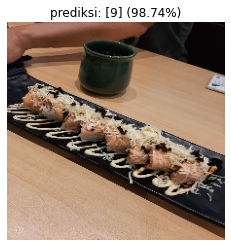

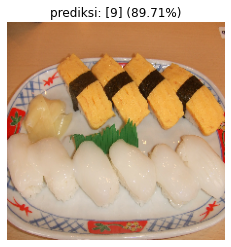

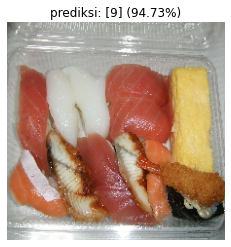

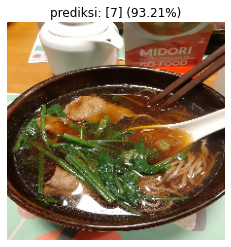

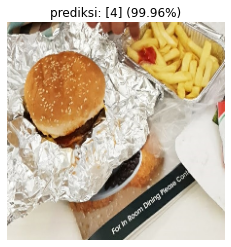

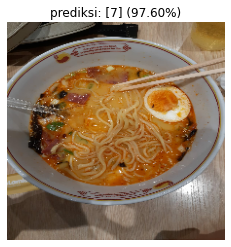

In [ ]:
import matplotlib.pyplot as plt

# Make predictions on custom food images
for img in custom_food_images:

  # Read in the image
  img = tf.io.read_file(img)

  # Decode it into a tensor
  img = tf.io.decode_image(img)

  # Resize the image
  img = tf.image.resize(img, [224, 224])

  # pred_prob = best_model_2.predict(tf.expand_dims(img, axis=0)) # make prediction on image with shape [None, 224, 224, 3]
  # pred_class = class_names[pred_prob.argmax()] # find the predicted class label

  pred_prob = best_model_2.predict(tf.expand_dims(img, axis=0)) # make prediction on image with shape [None, 224, 224, 3]
  pred_catg = pred_prob.argmax(axis=-1)

  # Plot the image with appropriate annotations
  plt.figure()
  plt.imshow(img/255.) # imshow() requires float inputs to be normalized
  plt.title(f"prediksi: {pred_catg} ({pred_prob.max()*100:.2f}%)")
  plt.axis(False)

In [ ]:
# Make predictions on custom food images
for img in custom_food_images:
  img = load_and_prep_image(img, scale=False) # load in target image and turn it into tensor
  pred_prob = best_model_3.predict(tf.expand_dims(img, axis=0)) # make prediction on image with shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class label
  # Plot the image with appropriate annotations
  plt.figure(dpi=150)
  plt.imshow(img/255.) # imshow() requires float inputs to be normalized
  plt.title(f"prediksi: {pred_class} ({pred_prob.max()*100:.2f}%)")
  plt.axis(False)